### Visualisation with LIME

https://donernesto.github.io/blog/explaining-text-classification-predictions-with-lime/

https://brainsteam.co.uk/2022/03/14/painless-explainability-for-text-models-with-eli5/

https://www.kdnuggets.com/2022/01/explain-nlp-models-lime.html

https://marcotcr.github.io/lime/tutorials/Lime%20-%20multiclass.html

In [1]:
import pandas as pd

from sklearn.pipeline import make_pipeline
from sklearn.svm import SVC
from sklearn.linear_model import SGDRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split

from lime.lime_text import LimeTextExplainer
from lime import lime_text

PATH_SENTENCE_TEXT = r"../dataset/concat_sentence_text.csv"
PATH_SEGMENT_TEXT = r"../dataset/concat_segment_text.csv"

In [2]:
# Data restructuring
df = pd.read_csv(PATH_SEGMENT_TEXT)
df_value_counts = df["practice"].value_counts().rename_axis("practice").reset_index(name = "counts")
df = df.fillna("None")

top_5_cats = list(df_value_counts["practice"][:5])
df = df[df["practice"].isin(top_5_cats)]

df.head()

,segment_text,practice,modality
2,2. THE INFORMATION WE COLLECT The information ...,Identifier_Cookie_or_similar_Tech_1stParty,PERFORMED
3,2. THE INFORMATION WE COLLECT The information ...,Identifier_IP_Address_1stParty,PERFORMED
4,"2.2 In addition, we store certain information ...",Identifier_Cookie_or_similar_Tech_1stParty,PERFORMED
12,2.6 Most browsers are initially set to accept ...,Identifier_Cookie_or_similar_Tech_1stParty,PERFORMED
13,"B) PERSONAL DATA, INCLUDING YOUR E-MAIL ADDRES...",Contact_E_Mail_Address_1stParty,PERFORMED


### Trying interpret text

need to debug: some issue with using labelencoder: interpret requires label encoder, but sklearn does not require that in the training process. 

In [56]:
from interpret_text.experimental.classical import BOWEncoder
from sklearn.preprocessing import LabelEncoder
from interpret_text.experimental.classical import ClassicalTextExplainer

In [62]:
from sklearn.base import TransformerMixin #gives fit_transform method for free
class MyLabelBinarizer(TransformerMixin):
    def __init__(self, *args, **kwargs):
        self.encoder = LabelEncoder(*args, **kwargs)
    def fit(self, x=0, y=0):
        self.encoder.fit(y)
        return self
    def transform(self, x=0, y=0):
        return self.encoder.transform(y)

In [63]:
# Train model
logistic = LogisticRegression(random_state = 1, max_iter = 500, n_jobs = -1, multi_class = "ovr")
vectorizer = TfidfVectorizer(stop_words={'english'}, ngram_range=(1,4), strip_accents='ascii', binary = True)
encoder = MyLabelBinarizer()

pipeline = make_pipeline(vectorizer, encoder, logistic)

x_train, x_test, y_train, y_test = train_test_split(df["segment_text"], df["practice"], test_size=0.2, random_state=0)
pipeline = pipeline.fit(x_train, y_train)
y_pred = pipeline.predict(x_test)

ValueError: y should be a 1d array, got an array of shape () instead.

In [61]:
y_train

8681     Identifier_Cookie_or_similar_Tech_1stParty
12072                             Location_1stParty
13461                 Contact_Phone_Number_1stParty
16974                             Location_1stParty
3957                 Identifier_IP_Address_1stParty
                            ...                    
4517                              Location_1stParty
17703               Contact_E_Mail_Address_1stParty
9100                 Identifier_IP_Address_1stParty
14106    Identifier_Cookie_or_similar_Tech_1stParty
14529               Contact_E_Mail_Address_1stParty
Name: practice, Length: 3151, dtype: object

In [ ]:
print(classification_report(y_test, y_pred))

                                            precision    recall  f1-score   support

           Contact_E_Mail_Address_1stParty       0.59      0.51      0.55       224
             Contact_Phone_Number_1stParty       0.30      0.38      0.34       121
Identifier_Cookie_or_similar_Tech_1stParty       0.83      0.80      0.82       171
            Identifier_IP_Address_1stParty       0.42      0.56      0.48       108
                         Location_1stParty       0.63      0.52      0.57       164

                                  accuracy                           0.56       788
                                 macro avg       0.56      0.55      0.55       788
                              weighted avg       0.58      0.56      0.57       788



In [52]:
bow_encoder = BOWEncoder()

bow_encoder.vectorizer = pipeline[0]

In [53]:
explainer = ClassicalTextExplainer(preprocessor=bow_encoder, model = pipeline['svc'], is_trained=True)

In [54]:
idx = 40

prediction = pipeline.predict([df["segment_text"].iloc[idx]])

explanation = explainer.explain_local(df["segment_text"].iloc[idx], prediction)

AttributeError: 'LabelEncoder' object has no attribute 'classes_'

In [55]:
prediction

array(['Contact_E_Mail_Address_1stParty'], dtype=object)

### Using SVC

In [3]:
# Make pipeline
svc = SVC(kernel = "linear", class_weight="balanced", probability=True)
vectorizer = TfidfVectorizer(stop_words={'english'}, ngram_range=(1,4), strip_accents='ascii', binary = True)
p1 = make_pipeline(vectorizer, svc)

In [4]:
x_train, x_test, y_train, y_test = train_test_split(df["segment_text"], df["practice"], test_size=0.2, random_state=0)

In [6]:
p1 = p1.fit(x_train, y_train)
y_pred = p1.predict(x_test)

In [8]:
print(classification_report(y_test, y_pred))

                                            precision    recall  f1-score   support

           Contact_E_Mail_Address_1stParty       0.59      0.51      0.55       224
             Contact_Phone_Number_1stParty       0.30      0.38      0.34       121
Identifier_Cookie_or_similar_Tech_1stParty       0.83      0.80      0.82       171
            Identifier_IP_Address_1stParty       0.42      0.56      0.48       108
                         Location_1stParty       0.63      0.52      0.57       164

                                  accuracy                           0.56       788
                                 macro avg       0.56      0.55      0.55       788
                              weighted avg       0.58      0.56      0.57       788



In [9]:
idx = 40

explainer = LimeTextExplainer(class_names=p1.classes_)
exp_1 = explainer.explain_instance(df["segment_text"].iloc[idx], p1.predict_proba, num_features=5, top_labels = 2)

In [11]:
print("Explanation fit: " + str(exp_1.score))
print("Predicted category: " + str(p1.predict([df["segment_text"].iloc[idx]])))
print("Actual category: " + str(df["practice"].iloc[idx]))
exp_1.show_in_notebook(text=True)

Explanation fit: 0.8213700121855465
Predicted category: ['Contact_E_Mail_Address_1stParty']
Actual category: Contact_E_Mail_Address_1stParty


### Using Logistic Regression

In [12]:
# Make pipeline
logistic = LogisticRegression(random_state = 1, max_iter = 500, n_jobs = -1, multi_class = "ovr")
vectorizer = TfidfVectorizer(stop_words={'english'}, ngram_range=(1,4), strip_accents='ascii', binary = True)
p2 = make_pipeline(vectorizer, logistic)

In [13]:
p2 = p2.fit(x_train, y_train)
y_pred = p2.predict(x_test)
print(classification_report(y_test, y_pred))

                                            precision    recall  f1-score   support

           Contact_E_Mail_Address_1stParty       0.52      0.74      0.61       224
             Contact_Phone_Number_1stParty       0.20      0.08      0.12       121
Identifier_Cookie_or_similar_Tech_1stParty       0.77      0.84      0.80       171
            Identifier_IP_Address_1stParty       0.46      0.40      0.43       108
                         Location_1stParty       0.60      0.52      0.56       164

                                  accuracy                           0.57       788
                                 macro avg       0.51      0.52      0.50       788
                              weighted avg       0.53      0.57      0.54       788



In [16]:
explainer = LimeTextExplainer(class_names=p2.classes_)
exp_2 = explainer.explain_instance(df["segment_text"].iloc[idx], p2.predict_proba, num_features=5, top_labels = 2)

In [17]:
print("Explanation fit: " + str(exp_2.score))
print("Predicted category: " + str(p2.predict([df["segment_text"].iloc[idx]])))
print("Actual category: " + str(df["practice"].iloc[idx]))
exp_2.show_in_notebook(text=True)

Explanation fit: 0.8745436419905999
Predicted category: ['Contact_E_Mail_Address_1stParty']
Actual category: Contact_E_Mail_Address_1stParty


### Part 2: LIME with word embeddings

In [3]:
import numpy as np
from sklearn.feature_extraction import text

In [4]:
class GloveVectorizer:
    def __init__(self, verbose=False, lowercase=True, remove_stopwords = True, minchars=3):
        
        # load in pre-trained word vectors
        print('Loading word vectors...')
        word2vec = {}
        embedding = []
        idx2word = []
        with open('../glove/glove.6B/glove.6B.50d.txt', encoding = "utf-8") as f:
              # is just a space-separated text file in the format:
              # word vec[0] vec[1] vec[2] ...
              for line in f:
                values = line.split()
                word = values[0]
                vec = np.asarray(values[1:], dtype='float32')
                word2vec[word] = vec
                embedding.append(vec)
                idx2word.append(word)
        print('Found %s word vectors.' % len(word2vec))

        self.word2vec = word2vec
        self.embedding = np.array(embedding)
        self.word2idx = {v:k for k,v in enumerate(idx2word)}
        self.V, self.D = self.embedding.shape
        self.verbose = verbose
        self.lowercase = lowercase
        self.remove_stopwords = remove_stopwords
        self.minchars = minchars

    def fit(self, data, *args):
        pass

    def transform(self, data, *args):
        stopwords = list(text.ENGLISH_STOP_WORDS)
        X = np.zeros((len(data), self.D))
        n = 0
        emptycount = 0

        for sentence in data:
            # Note: lower-casing the words
            if self.lowercase & self.remove_stopwords:
                tokens = sentence.lower().split()
                tokens = [word for word in tokens if word not in stopwords]

            else:
                tokens = sentence.split()
                tokens = [word for word in tokens if word not in stopwords]
            vecs = []
            for word in tokens:
                if len(word) >= self.minchars and word in self.word2vec:
                    vec = self.word2vec[word]
                    vecs.append(vec)
            if len(vecs) > 0:
                vecs = np.array(vecs)
                X[n] = vecs.mean(axis=0)
            else:
                emptycount += 1
            n += 1
        if self.verbose:
            print("Number of samples with no words found / total: %s / %s" % (emptycount, len(data)))
        return X

    def fit_transform(self, X, *args):
        self.fit(X, *args)
        return self.transform(X, *args)

In [5]:
gv = GloveVectorizer()

Loading word vectors...
Found 400000 word vectors.


### Using SVC

In [21]:
clf_svm = SVC(kernel = "linear", class_weight="balanced", probability=True)
p3 = make_pipeline(gv, clf_svm)

In [22]:
x_train, x_test, y_train, y_test = train_test_split(df["segment_text"], df["practice"], test_size=0.2, random_state=0)
p3 = p3.fit(x_train, y_train)
y_pred = p3.predict(x_test)

print(classification_report(y_test, y_pred))

                                            precision    recall  f1-score   support

           Contact_E_Mail_Address_1stParty       0.68      0.55      0.61       224
             Contact_Phone_Number_1stParty       0.42      0.57      0.48       121
Identifier_Cookie_or_similar_Tech_1stParty       0.75      0.74      0.75       171
            Identifier_IP_Address_1stParty       0.41      0.51      0.46       108
                         Location_1stParty       0.59      0.51      0.55       164

                                  accuracy                           0.58       788
                                 macro avg       0.57      0.58      0.57       788
                              weighted avg       0.60      0.58      0.59       788



In [25]:
idx = 40

explainer = LimeTextExplainer(class_names=p3.classes_)
exp_3 = explainer.explain_instance(df["segment_text"].iloc[idx], p3.predict_proba, num_features=5, top_labels = 2)

In [26]:
print("Explanation fit: " + str(exp_3.score))
print("Predicted category: " + str(p3.predict([df["segment_text"].iloc[idx]])))
print("Actual category: " + str(df["practice"].iloc[idx]))
exp_3.show_in_notebook(text=True)

Explanation fit: 0.8680630831371148
Predicted category: ['Contact_E_Mail_Address_1stParty']
Actual category: Contact_E_Mail_Address_1stParty


### Using Logistic regression

In [27]:
p4 = make_pipeline(gv, logistic)

In [33]:
x_train, x_test, y_train, y_test = train_test_split(df["segment_text"], df["practice"], test_size=0.2, random_state=0)
p4 = p4.fit(x_train, y_train)
y_pred = p4.predict(x_test)

print(classification_report(y_test, y_pred))

                                            precision    recall  f1-score   support

           Contact_E_Mail_Address_1stParty       0.58      0.79      0.67       224
             Contact_Phone_Number_1stParty       0.50      0.24      0.32       121
Identifier_Cookie_or_similar_Tech_1stParty       0.74      0.75      0.75       171
            Identifier_IP_Address_1stParty       0.49      0.38      0.43       108
                         Location_1stParty       0.57      0.58      0.57       164

                                  accuracy                           0.60       788
                                 macro avg       0.58      0.55      0.55       788
                              weighted avg       0.59      0.60      0.58       788



In [34]:
idx = 40

explainer = LimeTextExplainer(class_names=p4.classes_)
exp_4 = explainer.explain_instance(df["segment_text"].iloc[idx], p4.predict_proba, num_features=5, top_labels = 2)

In [35]:
print("Explanation fit: " + str(exp_4.score))
print("Predicted category: " + str(p4.predict([df["segment_text"].iloc[idx]])))
print("Actual category: " + str(df["practice"].iloc[idx]))
exp_4.show_in_notebook(text=True)

Explanation fit: 0.9030291909576238
Predicted category: ['Contact_E_Mail_Address_1stParty']
Actual category: Contact_E_Mail_Address_1stParty


### Ensemble models with word embeddings

In [47]:
idx = 63
print(df["segment_text"].iloc[idx])
print("Actual category: " + str(df["practice"].iloc[idx]))

AccuWeather and third party vendors, including Google, may use first-party cookies (such as the Google Analytics cookies) and third party cookies (such as the DoubleClick cookie) together to (a) inform, optimize and serve ads based on a user's past visits to the AccuWeather Sites, and/or (b) report how your ad impressions, other uses of ad services, and interactions with these ad impressions and ad services are related to visits to the AccuWeather Sites.
Actual category: Identifier_Cookie_or_similar_Tech_1stParty


In [36]:
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier, RandomForestClassifier

In [37]:
# Instantiate pipelines
p5 = make_pipeline(gv, GradientBoostingClassifier(random_state=0))
p6 = make_pipeline(gv, AdaBoostClassifier(random_state=0))
p7 = make_pipeline(gv, BaggingClassifier(random_state=0, n_jobs = -1))
p8 = make_pipeline(gv, RandomForestClassifier(random_state=0, n_jobs = -1))

In [38]:
p5 = p5.fit(x_train, y_train)
y_pred = p5.predict(x_test)
print(classification_report(y_test, y_pred))

                                            precision    recall  f1-score   support

           Contact_E_Mail_Address_1stParty       0.52      0.61      0.56       224
             Contact_Phone_Number_1stParty       0.27      0.22      0.25       121
Identifier_Cookie_or_similar_Tech_1stParty       0.71      0.74      0.72       171
            Identifier_IP_Address_1stParty       0.33      0.34      0.34       108
                         Location_1stParty       0.56      0.47      0.51       164

                                  accuracy                           0.51       788
                                 macro avg       0.48      0.48      0.48       788
                              weighted avg       0.51      0.51      0.51       788



In [39]:
p6 = p6.fit(x_train, y_train)
y_pred = p6.predict(x_test)
print(classification_report(y_test, y_pred))

                                            precision    recall  f1-score   support

           Contact_E_Mail_Address_1stParty       0.55      0.64      0.59       224
             Contact_Phone_Number_1stParty       0.31      0.26      0.29       121
Identifier_Cookie_or_similar_Tech_1stParty       0.67      0.71      0.69       171
            Identifier_IP_Address_1stParty       0.28      0.23      0.25       108
                         Location_1stParty       0.47      0.44      0.45       164

                                  accuracy                           0.50       788
                                 macro avg       0.46      0.46      0.45       788
                              weighted avg       0.48      0.50      0.49       788



In [40]:
p7 = p7.fit(x_train, y_train)
y_pred = p7.predict(x_test)
print(classification_report(y_test, y_pred))

                                            precision    recall  f1-score   support

           Contact_E_Mail_Address_1stParty       0.48      0.53      0.50       224
             Contact_Phone_Number_1stParty       0.17      0.16      0.16       121
Identifier_Cookie_or_similar_Tech_1stParty       0.64      0.65      0.65       171
            Identifier_IP_Address_1stParty       0.23      0.22      0.22       108
                         Location_1stParty       0.43      0.39      0.41       164

                                  accuracy                           0.43       788
                                 macro avg       0.39      0.39      0.39       788
                              weighted avg       0.42      0.43      0.42       788



In [41]:
p8 = p8.fit(x_train, y_train)
y_pred = p8.predict(x_test)
print(classification_report(y_test, y_pred))

                                            precision    recall  f1-score   support

           Contact_E_Mail_Address_1stParty       0.46      0.55      0.51       224
             Contact_Phone_Number_1stParty       0.15      0.12      0.14       121
Identifier_Cookie_or_similar_Tech_1stParty       0.70      0.69      0.70       171
            Identifier_IP_Address_1stParty       0.25      0.21      0.23       108
                         Location_1stParty       0.44      0.43      0.44       164

                                  accuracy                           0.45       788
                                 macro avg       0.40      0.40      0.40       788
                              weighted avg       0.43      0.45      0.44       788



### We see different features highlighted as important across the different models despite their performance being relatively alike across the predicted classes.

Could be because: 1. model performance was not good to begin with, 2. LIME fits a proxy model so the fit of the proxy changes, 3. the models genuinely view the features differently.

So it is necessary to be careful not to draw too many conclusive results from the highlighted features: could explain the underlying model, or could be other reasons

In [52]:
idx = 98

explainer = LimeTextExplainer(class_names=p5.classes_)
exp_5 = explainer.explain_instance(df["segment_text"].iloc[idx], p5.predict_proba, num_features=5, top_labels = 2)

print("Explanation fit: " + str(exp_5.score))
print("Predicted category: " + str(p5.predict([df["segment_text"].iloc[idx]])))
print("Actual category: " + str(df["practice"].iloc[idx]))
exp_5.show_in_notebook(text=True)

Explanation fit: 0.47463905843506016
Predicted category: ['Contact_E_Mail_Address_1stParty']
Actual category: Contact_E_Mail_Address_1stParty


In [53]:
explainer = LimeTextExplainer(class_names=p6.classes_)
exp_6 = explainer.explain_instance(df["segment_text"].iloc[idx], p6.predict_proba, num_features=5, top_labels = 2)

print("Explanation fit: " + str(exp_6.score))
print("Predicted category: " + str(p6.predict([df["segment_text"].iloc[idx]])))
print("Actual category: " + str(df["practice"].iloc[idx]))
exp_6.show_in_notebook(text=True)

Explanation fit: 0.2176766209102935
Predicted category: ['Contact_E_Mail_Address_1stParty']
Actual category: Contact_E_Mail_Address_1stParty


In [54]:
explainer = LimeTextExplainer(class_names=p7.classes_)
exp_7 = explainer.explain_instance(df["segment_text"].iloc[idx], p7.predict_proba, num_features=5, top_labels = 2)

print("Explanation fit: " + str(exp_7.score))
print("Predicted category: " + str(p7.predict([df["segment_text"].iloc[idx]])))
print("Actual category: " + str(df["practice"].iloc[idx]))
exp_7.show_in_notebook(text=True)

Explanation fit: 0.23582809204418875
Predicted category: ['Contact_Phone_Number_1stParty']
Actual category: Contact_E_Mail_Address_1stParty


In [55]:
explainer = LimeTextExplainer(class_names=p8.classes_)
exp_8 = explainer.explain_instance(df["segment_text"].iloc[idx], p8.predict_proba, num_features=5, top_labels = 2)

print("Explanation fit: " + str(exp_8.score))
print("Predicted category: " + str(p8.predict([df["segment_text"].iloc[idx]])))
print("Actual category: " + str(df["practice"].iloc[idx]))
exp_8.show_in_notebook(text=True)

Explanation fit: 0.49700003166946216
Predicted category: ['Contact_E_Mail_Address_1stParty']
Actual category: Contact_E_Mail_Address_1stParty


## Part 3: Using SHAP

https://h1ros.github.io/posts/sentiment-analysis-by-shap-with-logistic-regression/

https://medium.com/nlplanet/two-minutes-nlp-explain-predictions-with-shap-values-2a0e34219177

In [82]:
import shap
from sklearn.preprocessing import LabelEncoder

shap.initjs()

In [4]:
# Use logistic and tfidf
logistic = LogisticRegression(random_state = 1, max_iter = 500, n_jobs = -1, multi_class = "ovr")
vectorizer = TfidfVectorizer(stop_words={'english'}, ngram_range=(1,4), strip_accents='ascii', binary = True, min_df=10)

In [45]:
x_train, x_test, y_train, y_test = train_test_split(df["segment_text"], df["practice"], test_size=0.2, random_state=0)

x_train_tf = vectorizer.fit_transform(x_train)
x_test_tf = vectorizer.transform(x_test)

le = LabelEncoder()
y_train = pd.Series(le.fit_transform(y_train))
y_test = pd.Series(le.transform(y_test))

logistic = logistic.fit(x_train_tf, y_train)
y_pred = logistic.predict(x_test_tf)

In [26]:
explainer = shap.LinearExplainer(logistic, x_train_tf, feature_perturbation = "interventional")
shap_vals = explainer.shap_values(x_test_tf)

x_test_array = pd.DataFrame(x_test_tf.toarray())

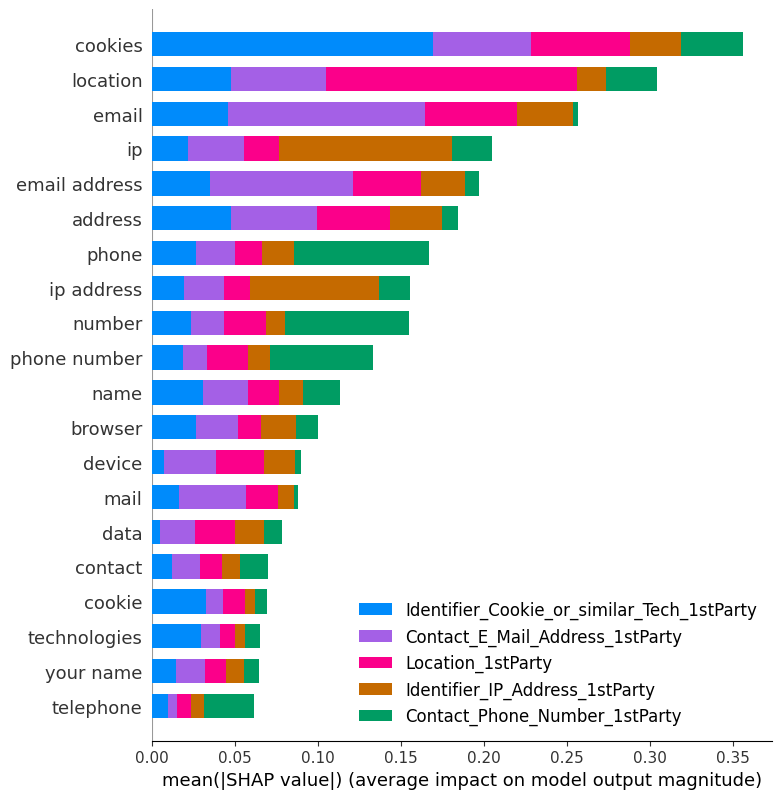

In [84]:
shap.summary_plot(shap_vals, x_test_array, feature_names = vectorizer.get_feature_names_out(), class_names = le.classes_)

In [108]:
def multi_shap_force_le(clf, index,
                        X_train_tf, y_train,
                        explainer, multi_shap_vals, feature_names,
                        le_classes,
                        classes='both'):
  
    """Takes in a fitted classifier Pipeline, the name of the classifier step,
        the X training DataFrame, the y train array, a shap explainer, and the
        multiclass shap values to print the ground truth and predicted label for
        the record and display shap force plots of the desired classes
        for the record specified by index.
    Args:
        clf (estimator): An sklearn Pipeline with a fitted classifier as the final step.
        
        clf_step_name (str): The name given to the classifier step of the pipe.
        
        index (int): The index of the observation of interest.
        
        X_train_df (DataFrame): A Pandas DataFrame that from the train-test-split
            used to train the classifier, with column names corresponding to
            the feature names.
        
        y_train (series or array): Subset of y data used for training.
        
        explainer (shap explainer): A fitted shap.TreeExplainer object
        
        multi_shap_vals (list): The list of arrays of shap values. One array per 
            target label.
        
        feature_names: Feature_names_out from fitted vectorizer.
        
        le_classes (array): The classes_ attribute of the label encoded target variable.
        
        classes (str, optional): A string specifying which shap force plots
            to display for the specified record. Options are 'all' (displays for all
            class labels), 'true' (displays only the plot for the ground truth label for
            the record), 'pred' (displays only the plot for the predicted label for
            the record), or 'both' (displays both 'true' and 'pred'). Defaults to 'both'.
    """

    ## Create dict for mapping class labels
    label_dict = {}
    for i, label in list(enumerate(le_classes)):
        label_dict[i] = label
        
    ## Store model prediction and ground truth label for that index
    # sentence_tf = fitted_vectorizer.transform(X_train_df.iloc[index,:])
    pred = int(clf.predict(X_train_tf[index].toarray()))
    true_label = pd.Series(y_train).iloc[index]


    ## Assess accuracy of prediction
    if true_label == pred:
        accurate = 'Correct!'
    else:
        accurate = 'Incorrect'
        

    ## Print output that checks model's prediction against true label
    print('***'*17)
    # Print ground truth label for row at index
    print(f'Ground Truth Label: {true_label} - {label_dict[true_label]}')
    print()
    # Print model prediction for row at index
    print(f'Model Prediction:  [{pred}] - {label_dict[pred]} -- {accurate}')
    print('***'*17)
    print()
    print()
    
 
    ## Determine which classes to show force plots for
    # All classes 
    if classes == 'all':
        ## Visualize the ith prediction's explanation for all classes
        for key in range(len(label_dict)):
            print(f'{label_dict[key]} Class ({key})')
            display(shap.force_plot(explainer.expected_value[key],
                        multi_shap_vals[key][index],
                        X_train_tf[index].toarray(), feature_names = feature_names))
            print()
    
    
    # Only the class predicted by the model
    elif classes == 'pred':
        print(f'Predicted: {label_dict[pred]} Class {pred}')
        display(shap.force_plot(explainer.expected_value[pred],
                                multi_shap_vals[pred][index],
                                X_train_tf[index].toarray(), feature_names = feature_names))

     
    # Only the ground truth label
    elif classes == 'true':
        print(f'True: {label_dict[true_label]} Class {true_label}')
        display(shap.force_plot(explainer.expected_value[true_label],
                    multi_shap_vals[true_label][index],
                    X_train_tf[index].toarray(), feature_names = feature_names))

    
    # Both the predicted and ground truth (identical plots if prediction is correct)
    elif classes == 'both':
        print(f'Predicted: {label_dict[pred]} Class {pred}')
        display(shap.force_plot(explainer.expected_value[pred],
                                multi_shap_vals[pred][index],
                                X_train_tf[index].toarray(), feature_names = feature_names))
        print()

        print(f'True: {label_dict[true_label]} Class {true_label}')
        display(shap.force_plot(explainer.expected_value[true_label],
                    multi_shap_vals[true_label][index],
                    X_train_tf[index].toarray(), feature_names = feature_names))

In [109]:
multi_shap_force_le(logistic, 50, x_train_tf, y_train, explainer, shap_vals, vectorizer.get_feature_names_out(), le.classes_, classes = "all")

***************************************************
Ground Truth Label: 0 - Contact_E_Mail_Address_1stParty

Model Prediction:  [0] - Contact_E_Mail_Address_1stParty -- Correct!
***************************************************


Contact_E_Mail_Address_1stParty Class (0)



Contact_Phone_Number_1stParty Class (1)



Identifier_Cookie_or_similar_Tech_1stParty Class (2)



Identifier_IP_Address_1stParty Class (3)



Location_1stParty Class (4)


## Other visualisation packages

Using interpret text
- https://coderzcolumn.com/tutorials/machine-learning/interpret-text-interpret-nlp-models-and-their-predictions


OmniXai
- https://blog.salesforceairesearch.com/omnixai/
- https://opensource.salesforce.com/OmniXAI/latest/tutorials/nlp/l2x.html
- https://opensource.salesforce.com/OmniXAI/latest/omnixai.explainers.nlp.html
- https://opensource.salesforce.com/OmniXAI/latest/omnixai.data.html